In [1]:
import cv2 as cv
import numpy as np
import imutils
import matplotlib.pyplot as plt

In [60]:
from os import listdir

photos = []
for file in listdir('/Users/liyakul/Desktop/proekt/shar/'):
    photos.append('/Users/liyakul/Desktop/proekt/shar/' + file)
del photos[0]

In [8]:
def print_image(image):
    plt.figure(figsize=(10, 10))
    plt.subplot(),plt.imshow(image)
    plt.xticks([]),plt.yticks([])
    plt.show()

In [45]:
def find_circles_no_params(path):
    img_ = cv.imread(path)
    print(img_.shape)
    gray_ = cv.cvtColor(img_, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray_,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=20)
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        cv.circle(img_,(i[0],i[1]),i[2],(0,255,0),2)
    print_image(img_)
    
# (i[0],i[1]),i[2] - (x, y), r - координаты центра и радиус
# cirlesх[0,:] -массив таких троек
# функция без параметров, ищет все круги

(317, 339, 3)


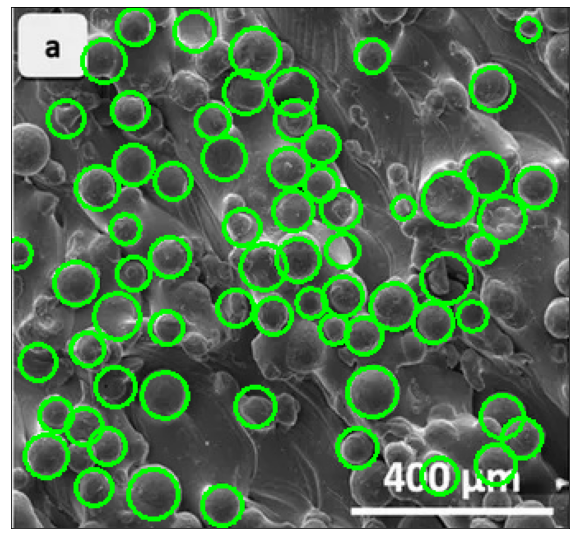

In [41]:
find_circles_no_params('/Users/liyakul/Desktop/proekt/microphoto.jpg')

(466, 600, 3)


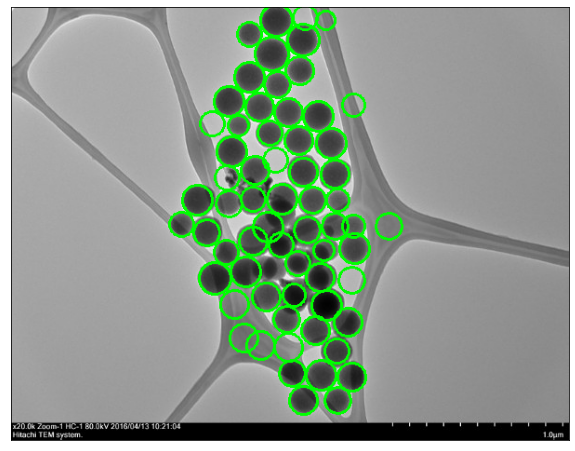

(569, 507, 3)


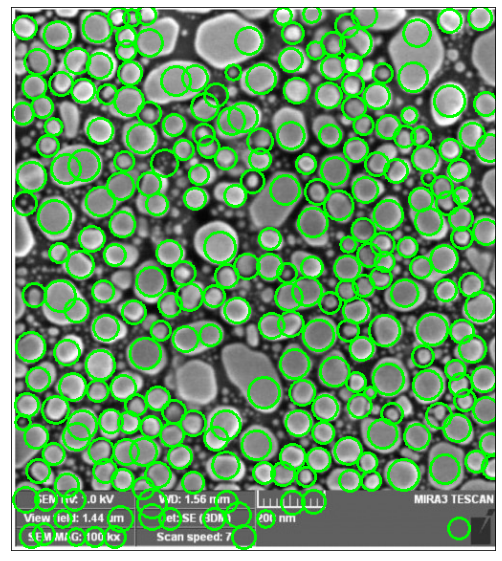

(735, 980, 3)


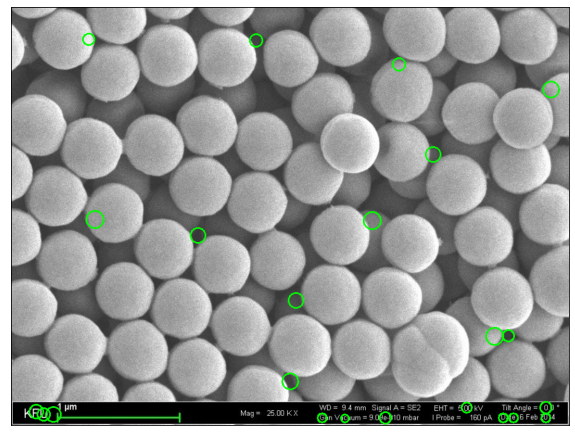

(960, 1228, 3)


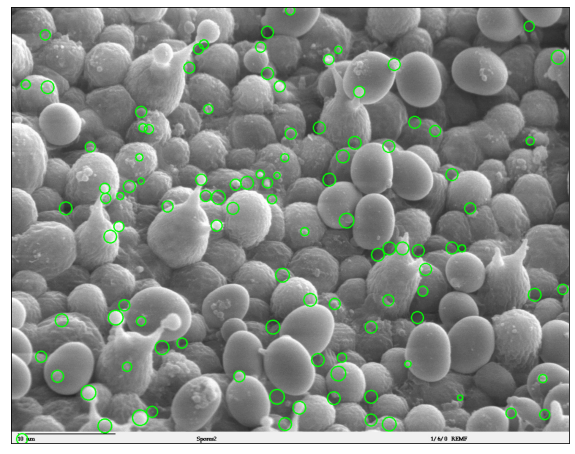

(1001, 1500, 3)


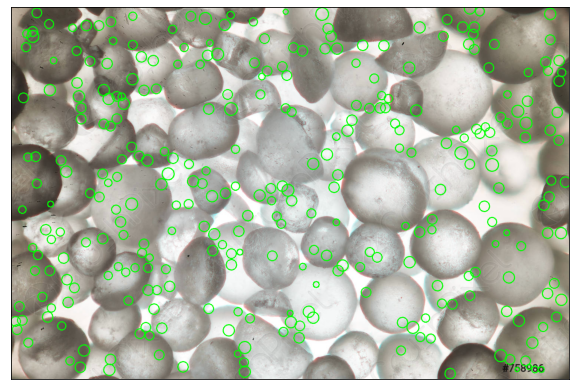

(837, 1020, 3)


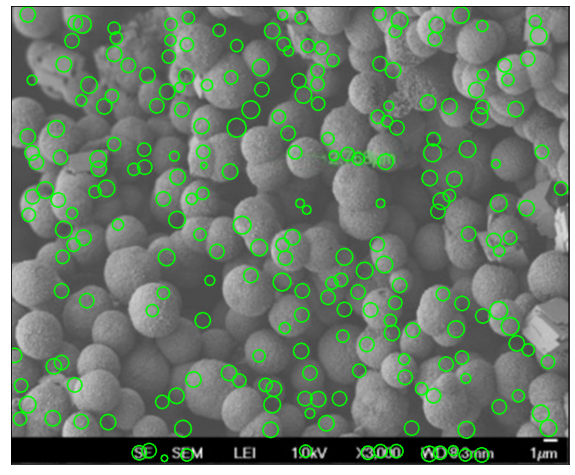

(317, 339, 3)


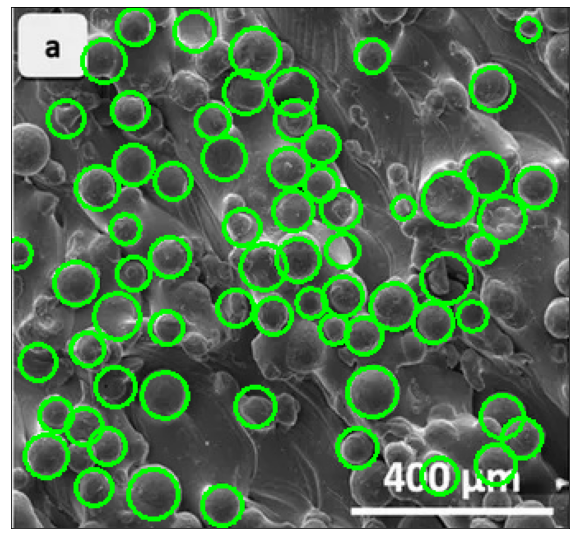

(530, 800, 3)


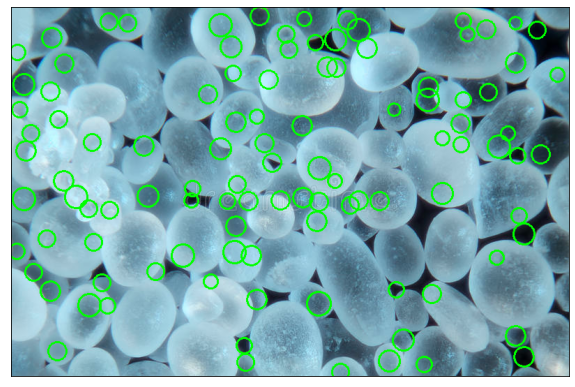

(231, 187, 3)


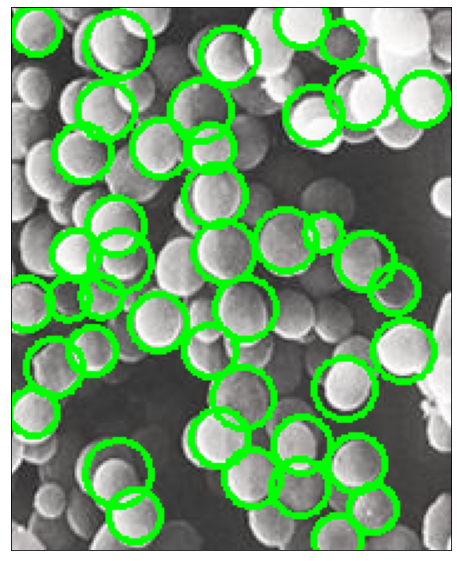

(768, 1024, 3)


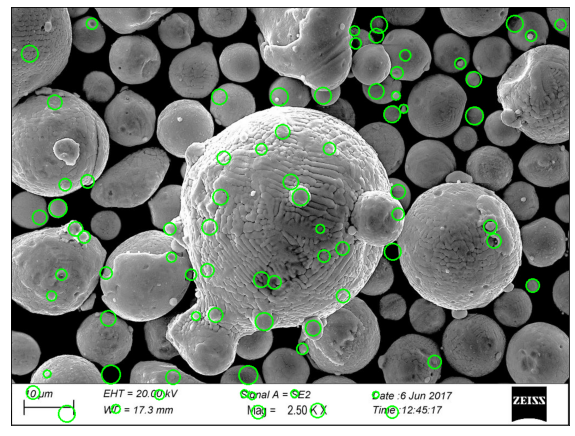

(203, 281, 3)


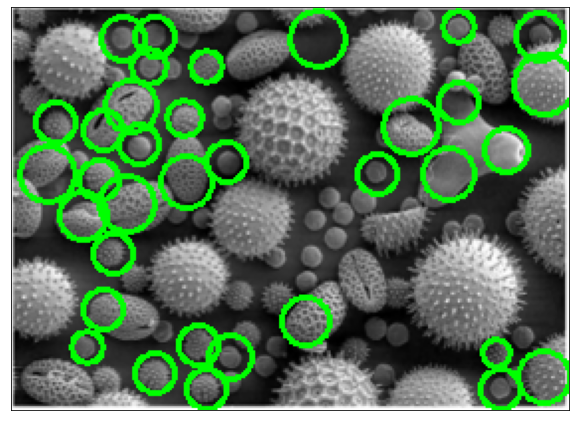

(1196, 1600, 3)


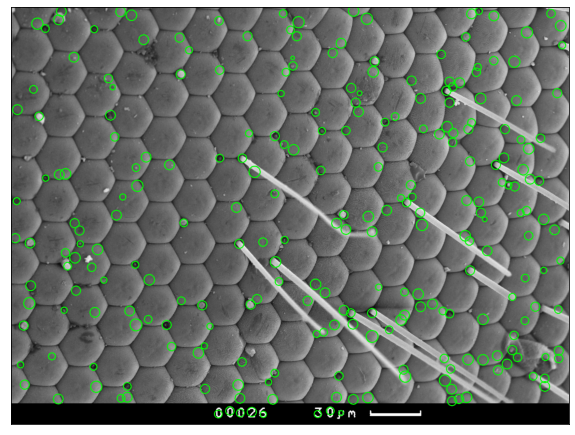

(390, 521, 3)


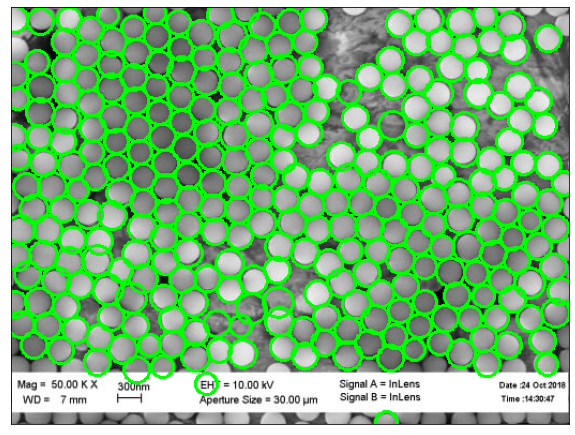

In [105]:
for photo in photos:
    find_circles_no_params(photo)

На этом этапе я заметила, что программа хорошо работает для фотографий небольшого размера и плохо иначе. Далее я нашла размеры фотографий и визуально определила "хороший" размер, где функция работала наиболее точно. Это помогло подогнать большие фотографии под нужный размер. Можно увидеть, что теперь функция хорошо работает на всех фотографиях.

(317, 339, 3) + \
(390, 521, 3) + \
(203, 281, 3) + \
(1196, 1600, 3) - \
(530, 800, 3) - \
(231, 187, 3) + \
(569, 507, 3) +- \
(768, 1024, 3) - \
(466, 600, 3) + \
(837, 1020, 3) - \
(1001, 1500, 3) - \
(735, 980, 3) - \
(960, 1228, 3) -

(231, 187, 3) + \
(203, 281, 3) + \
(317, 339, 3) + \
(390, 521, 3) + \
(466, 600, 3) + \
(530, 800, 3) - \
(569, 507, 3) +- \
(735, 980, 3) - \
(768, 1024, 3) - \
(837, 1020, 3) - \
(960, 1228, 3) - \
(1001, 1500, 3) - \
(1196, 1600, 3) - 

In [79]:
def find_circles_with_resize(path):
    img = cv.imread(path)
    maxr = 20
    if img.shape[0] > 500 or img.shape[1] > 500:
        width = 400
        height = (img.shape[0] * width) // img.shape[1]
        img = cv.resize(img, (width, height))
        maxr = 25
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=maxr)
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        cv.circle(img,(i[0],i[1]),i[2],(0,255,0),2)
    print_image(img)

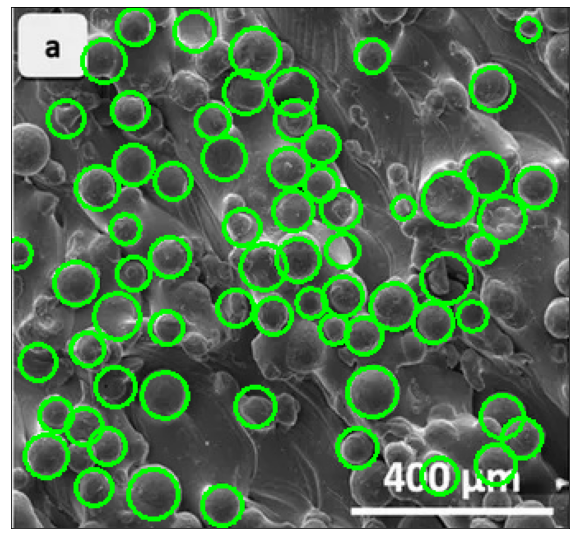

In [75]:
find_circles_with_resize('/Users/liyakul/Desktop/proekt/microphoto.jpg')

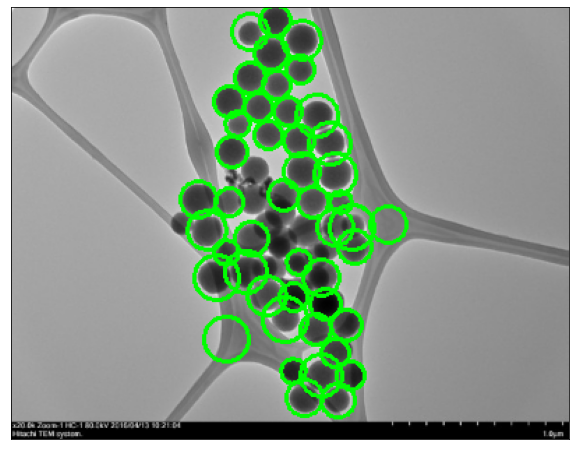

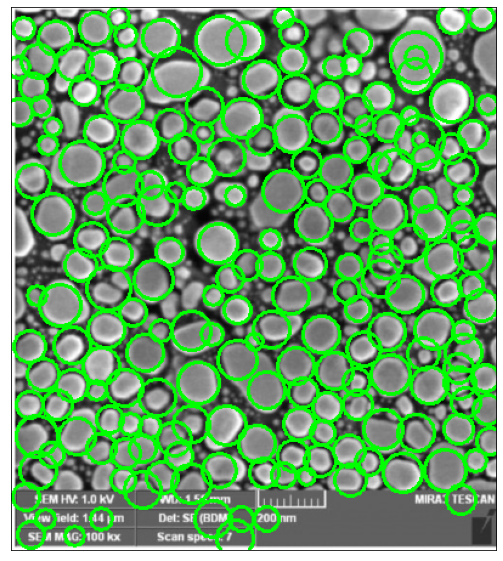

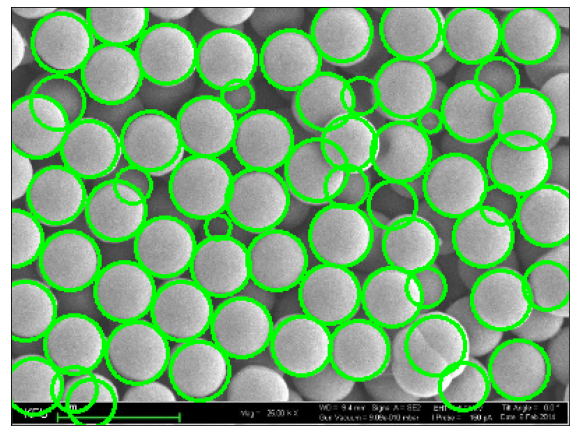

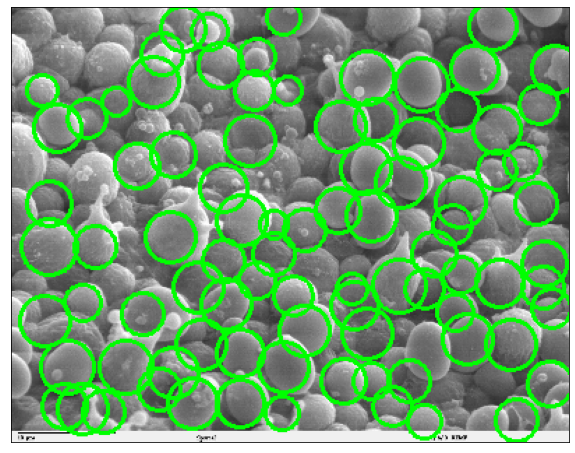

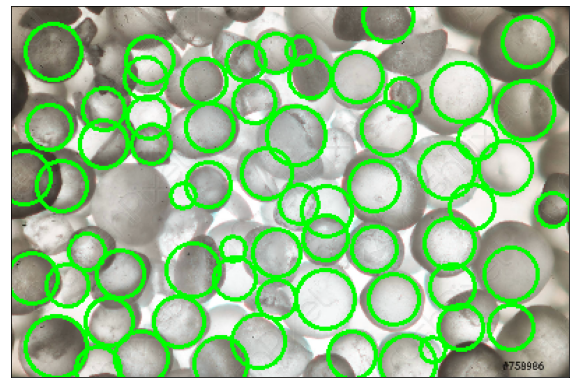

...

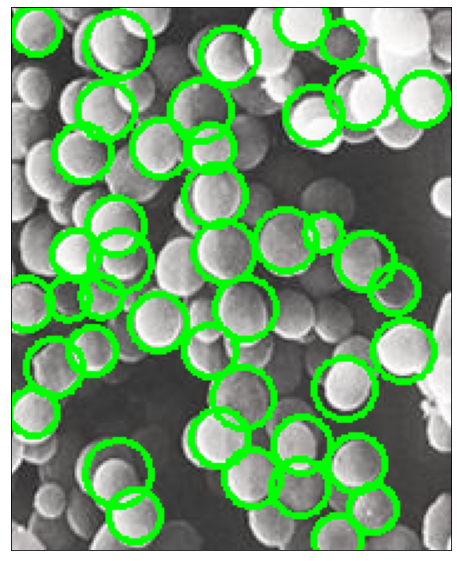

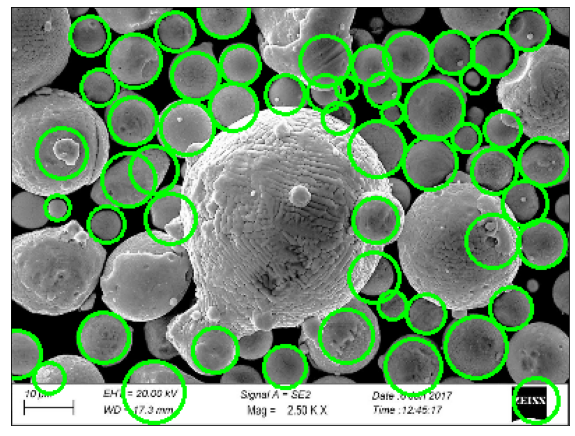

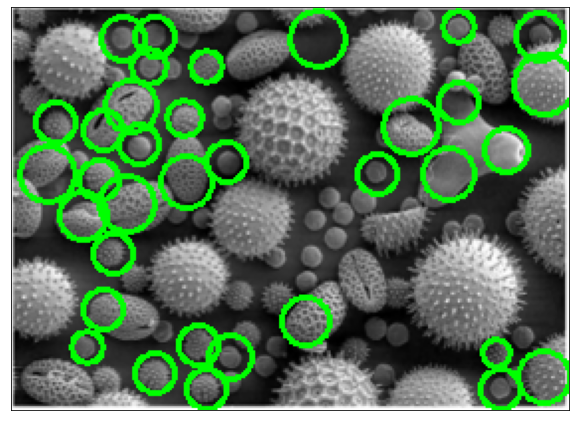

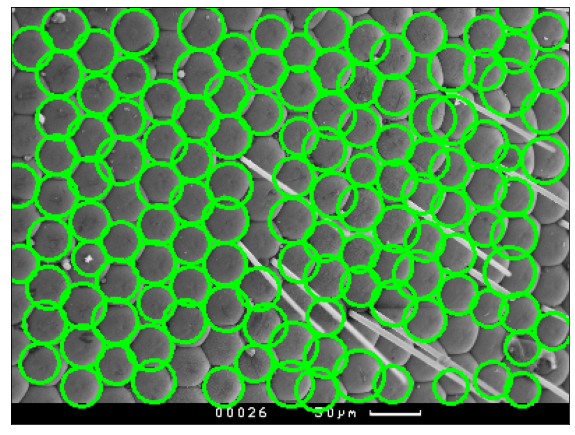

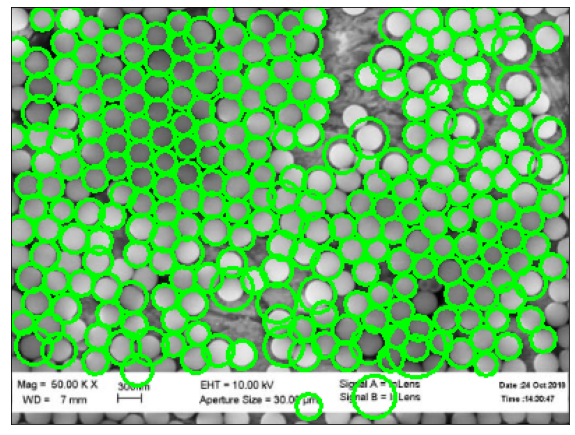

In [80]:
for photo in photos:
    find_circles_with_resize(photo)

In [83]:
def find_circles_blur(path):
    img = cv.imread(path)
    maxr = 20
    img = cv.medianBlur(img,5)
    if img.shape[0] > 500 or img.shape[1] > 500:
        width = 400
        height = (img.shape[0] * width) // img.shape[1]
        img = cv.resize(img, (width, height))
        maxr = 25
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=maxr)
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        cv.circle(img,(i[0],i[1]),i[2],(0,255,0),2)
    print_image(img)

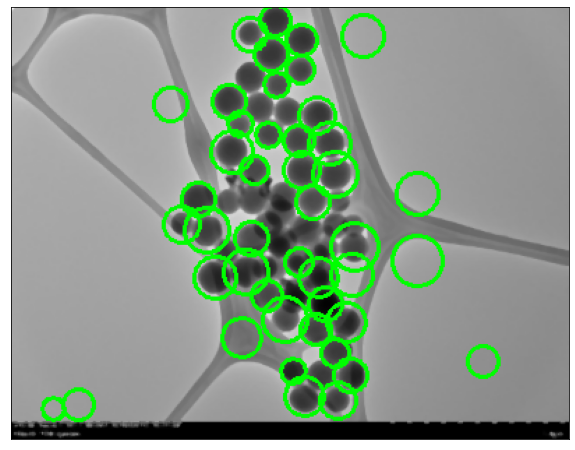

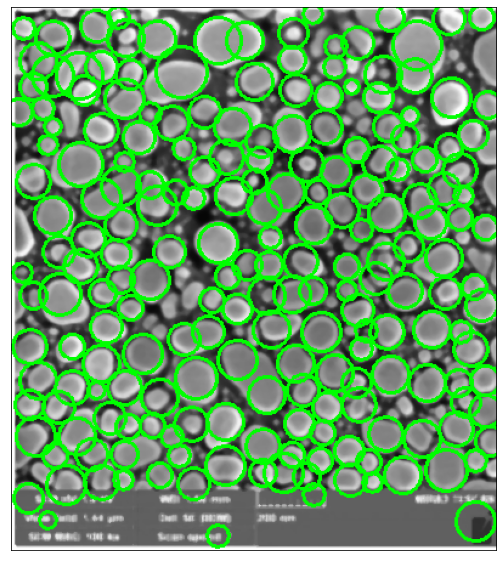

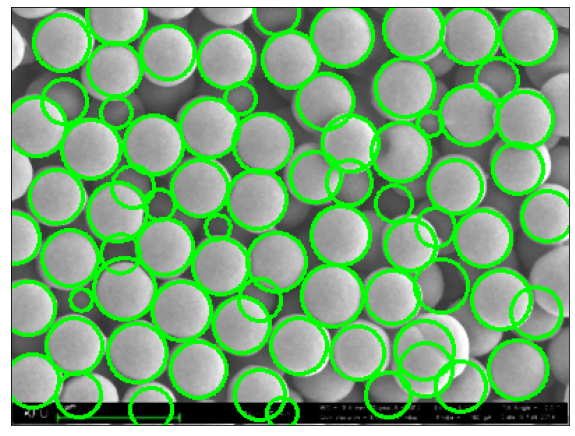

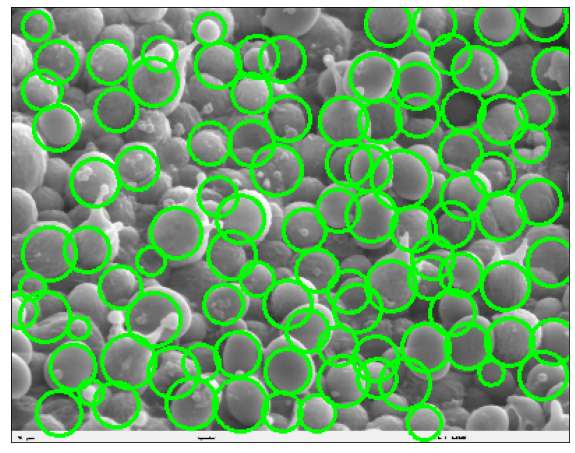

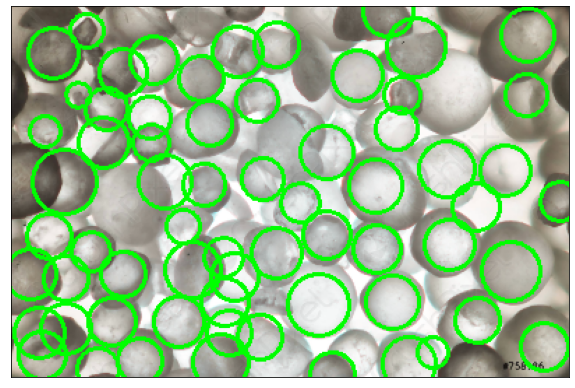

...

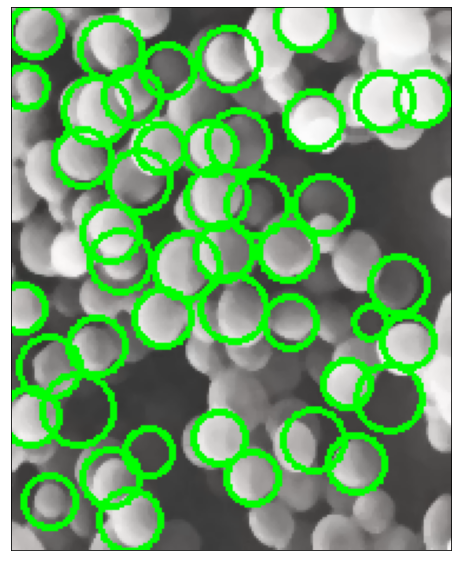

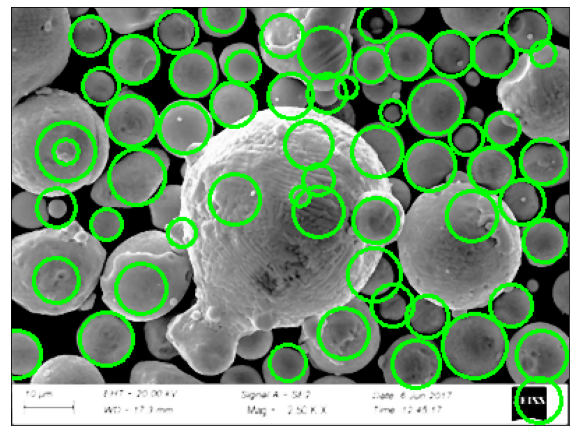

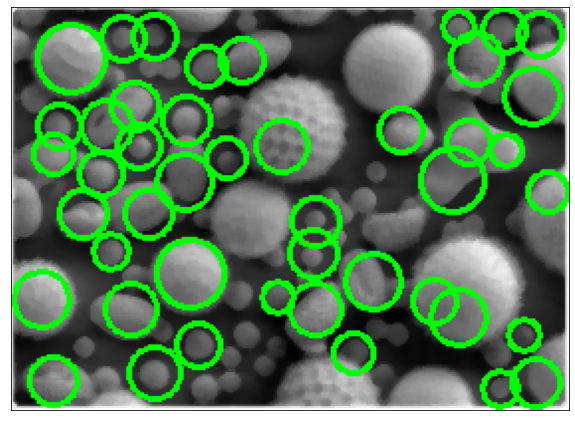

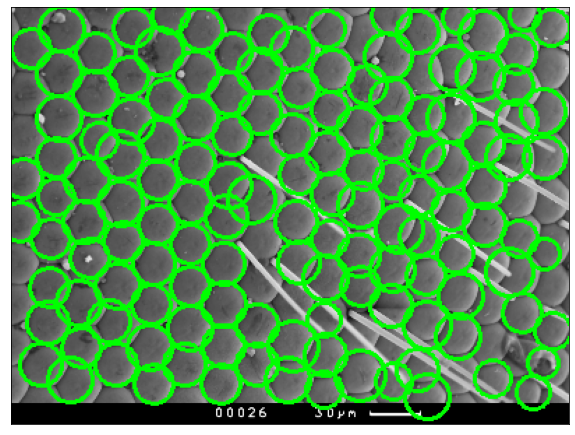

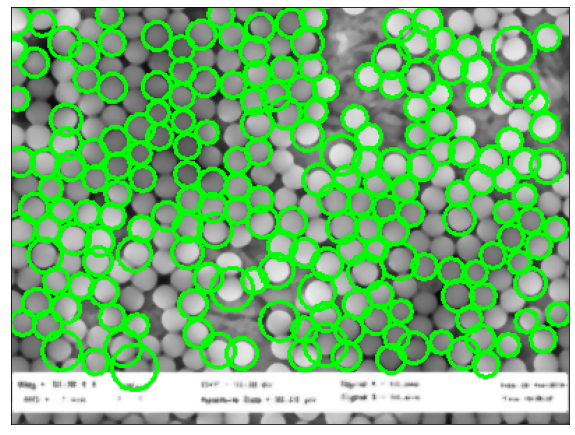

In [93]:
for photo in photos:
    find_circles_blur(photo)

In [100]:
def find_circles(path, radius):
    img_orig = cv.imread(path)
    maxr = 2
    if img_orig.shape[0] > 500 or img_orig.shape[1] > 500:
        width = 400
        height = (img_orig.shape[0] * width) // img_orig.shape[1]
        img_orig = cv.resize(img_orig, (width, height))
        maxr = 25
    img = img_orig.copy()
    img = cv.medianBlur(img,5)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=maxr)
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        if i[2] == radius:
            cv.circle(img_orig,(i[0],i[1]),i[2],(0,255,0),2)
    print_image(img_orig)

ERROR! Session/line number was not unique in database. History logging moved to new session 149


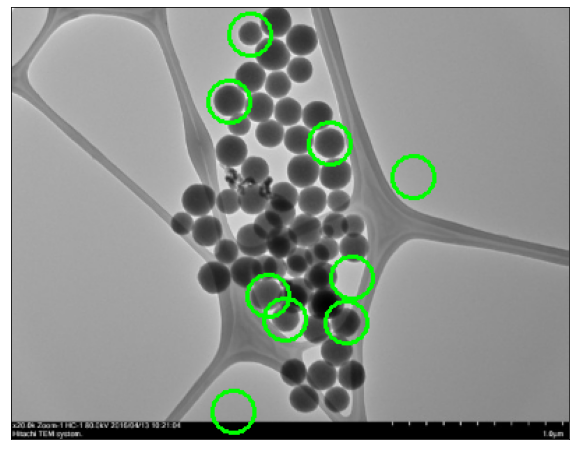

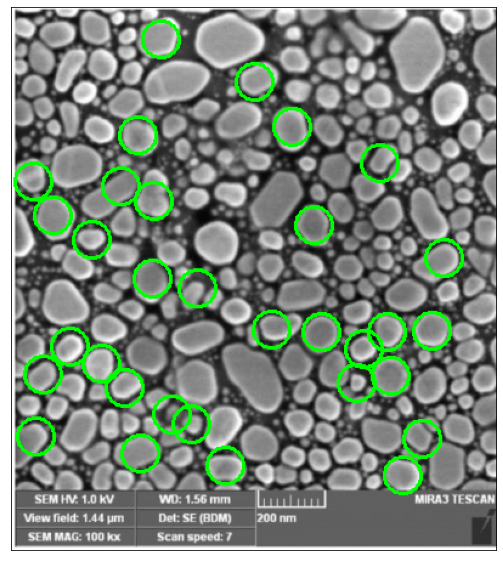

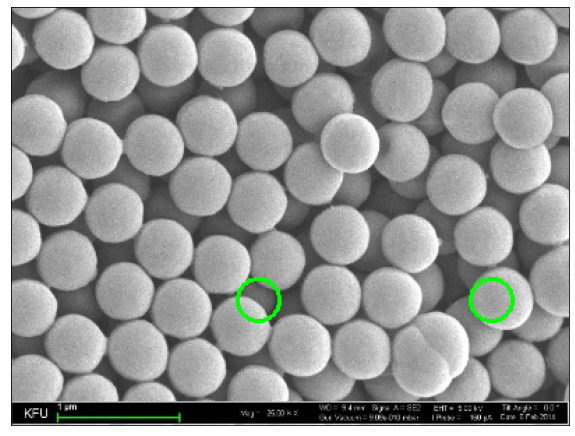

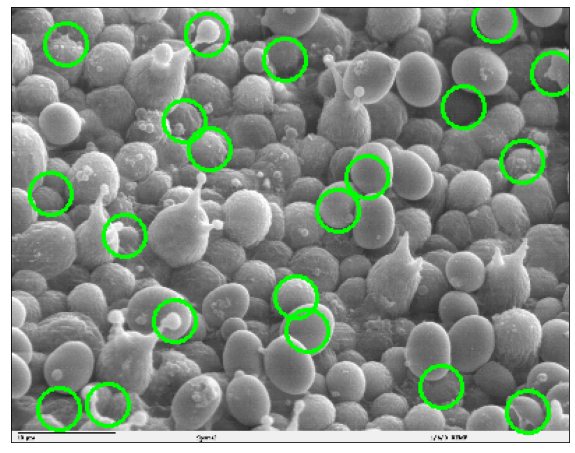

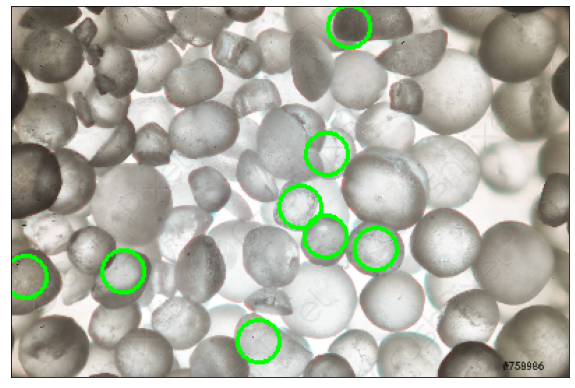

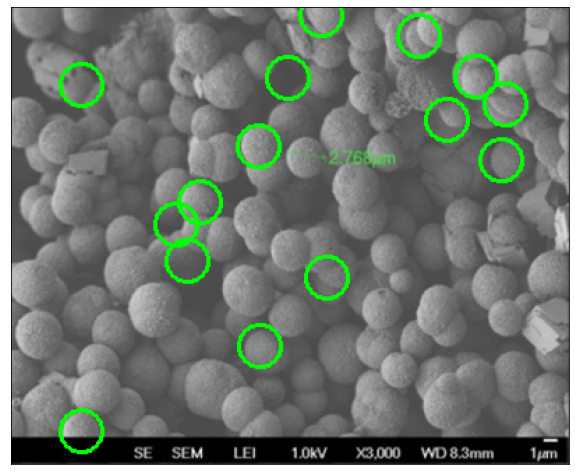

In [ ]:
for photo in photos:
    find_circles(photo, 15)

In [115]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn import datasets

In [121]:
def find_circles_radius(path):
    img = cv.imread(path)
    maxr = 20
    if img.shape[0] > 500 or img.shape[1] > 500:
        width = 400
        height = (img.shape[0] * width) // img.shape[1]
        img = cv.resize(img, (width, height))
        maxr = 25
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=maxr)
    circles = np.uint16(np.around(circles))
    rads = []
    for i in circles[0,:]:
        rads.append(i[2]);
    plt.hist(rads, bins = np.arange(20))
    plt.show()


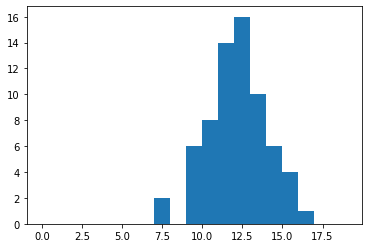

In [119]:
find_circles_radius('/Users/liyakul/Desktop/proekt/microphoto.jpg')

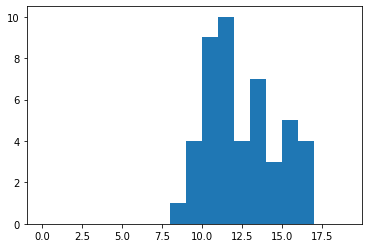

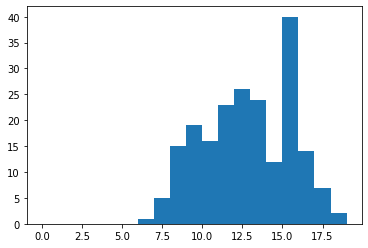

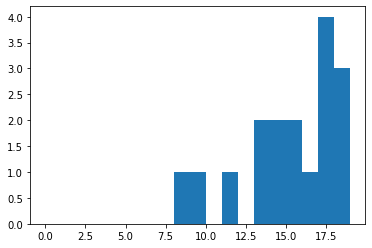

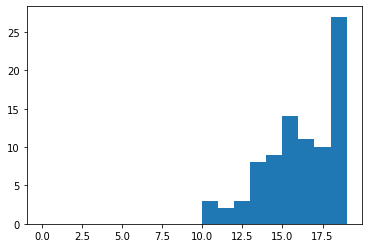

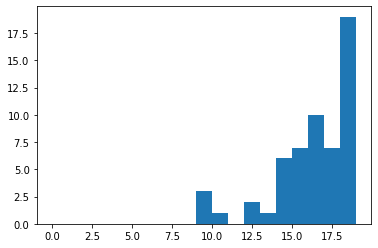

...

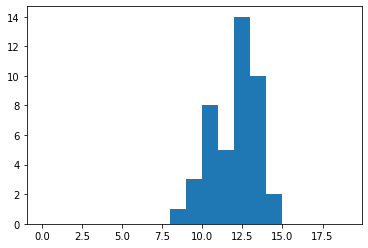

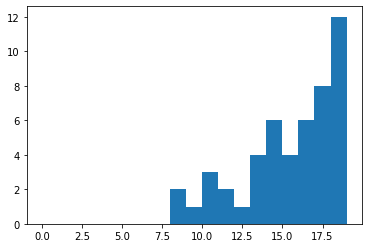

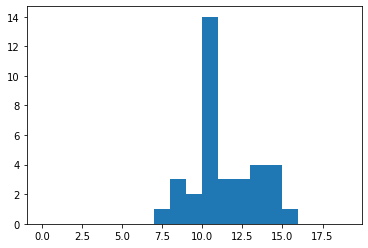

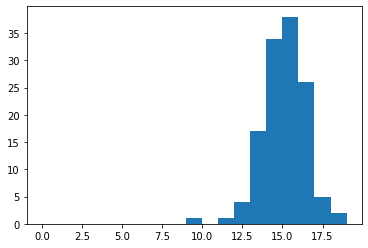

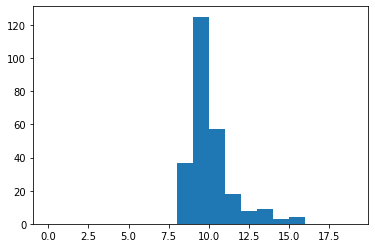

In [122]:
for photo in photos:
    find_circles_radius(photo)